# TASEP Simulatiion


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
L=10
N=3
x=np.sort(np.random.choice(np.arange(0,L),N,replace=False))
Lattice=np.zeros((1,L)).astype(int)
Lattice[0,x]=1
Lattice[0,:],x,Lattice[0,x]

(array([0, 1, 0, 0, 1, 0, 1, 0, 0, 0]), array([1, 4, 6]), array([1, 1, 1]))

In [3]:
def Initialize(L,N):
  x=np.sort(np.random.choice(np.arange(0,L),N,replace=False))
  Lattice=np.zeros((1,L)).astype(int)
  Lattice[0,x]=1
  return Lattice

In [4]:
def Moves_1(Lattice):
  L=len(Lattice)
  Lattice_new=Lattice*0
  N=np.sum(Lattice==1)
  x=np.array(np.where(Lattice==1)).flatten()
  succ=0
  for i in range(N):
    tmp=np.mod(x[i]+1,L)
    if Lattice[tmp]==0:
       x[i]=tmp
       succ+=1
  Lattice_new[x]=1
  return Lattice_new,succ     

In [5]:
N=3
L=10
Lattice=Initialize(L,N)
Lattice.shape, np.sum(Lattice[0,]==1),Lattice

((1, 10), 3, array([[0, 1, 1, 1, 0, 0, 0, 0, 0, 0]]))

In [6]:
Lattice_new,success=Moves_1(Lattice[0,])
Lattice_new=np.reshape(Lattice_new,(1,-1))
Lattice=np.concatenate([Lattice,Lattice_new])
Lattice,success

(array([[0, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [0, 1, 1, 0, 1, 0, 0, 0, 0, 0]]),
 1)

In [7]:
def Moves_T(Lattice,T):
  T_now,L=Lattice.shape
  success_T=0
  for t in range(T_now,T_now+T):
    Lattice_new,succ=Moves_1(Lattice[t-1,])
    Lattice_new=np.reshape(Lattice_new,(1,-1))
    Lattice=np.concatenate([Lattice,Lattice_new])
    success_T+=succ
  return Lattice,success_T     

In [8]:
N=5
L=10
Lattice=Initialize(L,N)
Lattice.shape, np.sum(Lattice[0,]==1),Lattice

((1, 10), 5, array([[1, 1, 0, 0, 1, 0, 1, 0, 0, 1]]))

In [9]:
Lattice,success=Moves_T(Lattice,1)
Lattice,success

(array([[1, 1, 0, 0, 1, 0, 1, 0, 0, 1],
        [1, 0, 1, 0, 0, 1, 0, 1, 0, 1]]),
 3)

In [10]:
Lattice,success=Moves_T(Lattice,2)
Lattice,success

(array([[1, 1, 0, 0, 1, 0, 1, 0, 0, 1],
        [1, 0, 1, 0, 0, 1, 0, 1, 0, 1],
        [0, 1, 0, 1, 0, 0, 1, 0, 1, 1],
        [1, 0, 1, 0, 1, 0, 0, 1, 1, 0]]),
 8)

In [11]:
Lattice,success=Moves_T(Lattice,2)
Lattice,success

(array([[1, 1, 0, 0, 1, 0, 1, 0, 0, 1],
        [1, 0, 1, 0, 0, 1, 0, 1, 0, 1],
        [0, 1, 0, 1, 0, 0, 1, 0, 1, 1],
        [1, 0, 1, 0, 1, 0, 0, 1, 1, 0],
        [0, 1, 0, 1, 0, 1, 0, 1, 0, 1],
        [1, 0, 1, 0, 1, 0, 1, 0, 1, 0]]),
 9)

In [12]:
N=10
L=100
T=200
Lattice=Initialize(L,N)
Lattice,success=Moves_T(Lattice,T)
Lattice.shape,success

((201, 100), 2000)

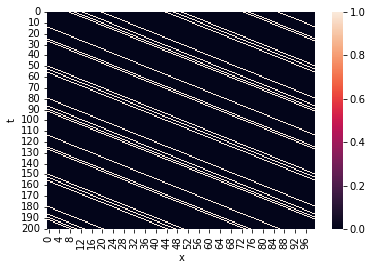

In [13]:
Lattice_100_10=Lattice
sns.heatmap(Lattice)
plt.xlabel("x")
plt.ylabel("t")
plt.show()

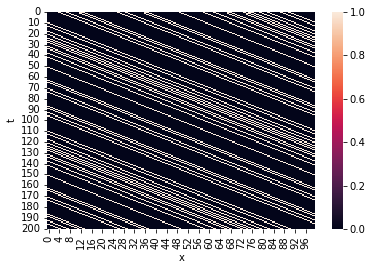

In [14]:
N=20
L=100
T=200
Lattice=Initialize(L,N)
Lattice,success=Moves_T(Lattice,T)
Lattice_100_20=Lattice
sns.heatmap(Lattice)
plt.xlabel("x")
plt.ylabel("t")
plt.show()

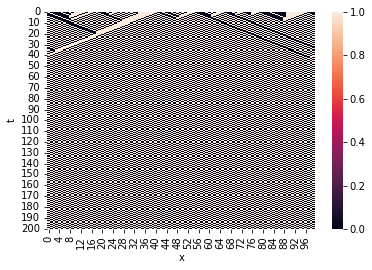

In [15]:
N=50
L=100
T=200
Lattice=Initialize(L,N)
Lattice,success=Moves_T(Lattice,T)
Lattice_100_50=Lattice
sns.heatmap(Lattice)
plt.xlabel("x")
plt.ylabel("t")
plt.show()

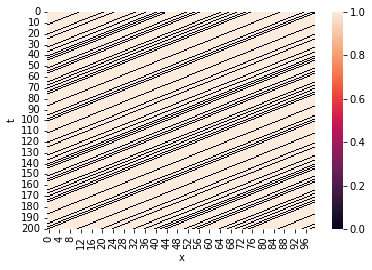

In [16]:
N=80
L=100
T=200
Lattice=Initialize(L,N)
Lattice,success=Moves_T(Lattice,T)
Lattice_100_80=Lattice
sns.heatmap(Lattice)
plt.xlabel("x")
plt.ylabel("t")
plt.show()

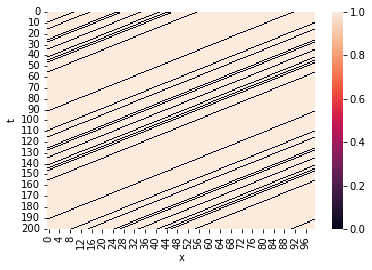

In [17]:
N=90
L=100
T=200
Lattice=Initialize(L,N)
Lattice,success=Moves_T(Lattice,T)
Lattice_100_90=Lattice
sns.heatmap(Lattice)
plt.xlabel("x")
plt.ylabel("t")
plt.show()

In [18]:
def Current(L,N,T,T_ini):
  x=np.sort(np.random.choice(np.arange(0,L),N,replace=False))
  Lattice=np.zeros((1,L)).astype(int)
  Lattice[0,x]=1
  for t in range(1,T_ini+1):
    Lattice_new,succ=Moves_1(Lattice[t-1,])
    Lattice_new=np.reshape(Lattice_new,(1,-1))
    Lattice=np.concatenate([Lattice,Lattice_new])

  success_T=0
  for t in range(T_ini+1,T_ini+T+1):
    Lattice_new,succ=Moves_1(Lattice[t-1,])
    Lattice_new=np.reshape(Lattice_new,(1,-1))
    Lattice=np.concatenate([Lattice,Lattice_new])
    success_T+=succ

  return success_T/(L*T)


In [19]:
Current(100,10,100,100),Current(100,50,100,100),Current(100,90,100,100)

(0.1, 0.5, 0.1)

In [20]:
N_vs_current=[]
for N in range(10,100,10):
  out=Current(100,N,100,100)
  N_vs_current.append(out)

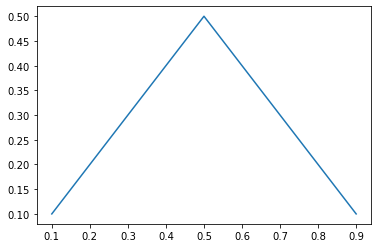

In [21]:
rho=np.arange(10,100,10)/100
plt.plot(rho,N_vs_current)
plt.show()

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

In [23]:
theta = np.linspace(0,2*np.pi, 100)
# fig, axオブジェクトを作成
fig, ax = plt.subplots()
# グラフのリスト作成
ims=[]
xs = np.cos(theta)
ys = np.sin(theta)
for i in range(100): 
    x = np.cos(theta[i])
    y = np.sin(theta[i])
    im1 = ax.plot(xs, ys, color='blue')
    im2 = ax.scatter(x, y, color='red')
    # グラフをリストに加える
    ims.append(im1+[im2])
# 各軸のラベル
ax.set_xlabel("x", fontsize=15)
ax.set_ylabel("y", fontsize=15)
# グラフの範囲を設定
ax.set_xlim([-1.1, 1.1])
ax.set_ylim([-1.1, 1.1]) 

# ArtistAnimationにfigオブジェクトとimsを代入してアニメーションを作成
anim = animation.ArtistAnimation(fig, ims)

# Google Colaboratoryの場合必要
rc('animation', html='jshtml')
plt.close()
anim

In [24]:
Lattice_100_10.shape

(201, 100)

In [25]:
Lattice=Lattice_100_10
np.where(Lattice[0,:]==1)

(array([ 8, 10, 13, 20, 44, 47, 50, 73, 75, 86]),)

In [26]:
Lattice=Lattice_100_10
T,L=Lattice.shape
theta = np.linspace(0,2*np.pi, L)
# fig, axオブジェクトを作成
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
# fig, ax = plt.subplots()
# グラフのリスト作成
ims=[]
xs = np.cos(theta)
ys = np.sin(theta)
for i in range(T): 
    cars= np.where(Lattice[i,:]==1)
    x_cars = np.cos(-theta[cars])
    y_cars = np.sin(-theta[cars])
    im1 = ax.scatter(xs, ys, color='blue',marker="o",alpha=0.5,s=200)
    im2 = ax.scatter(x_cars, y_cars, color='red',marker="o",s=120)
    # グラフをリストに加える
    ims.append([im1]+[im2])
# 各軸のラベル
ax.set_xlabel("x", fontsize=15)
ax.set_ylabel("y", fontsize=15)
# グラフの範囲を設定
ax.set_xlim([-1.1, 1.1])
ax.set_ylim([-1.1, 1.1]) 

# ArtistAnimationにfigオブジェクトとimsを代入してアニメーションを作成
anim = animation.ArtistAnimation(fig, ims)

# Google Colaboratoryの場合必要
rc('animation', html='jshtml')
plt.close()
anim